<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1TRNaCfYstvcIQqoUSdukYQGF6LuyL7Tv" width=600 height=320/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

# Домашнее задание. Автоэнкодеры


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (1 балл)


In [ ]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt

import os
import pandas as pd
import skimage.io
from skimage.transform import resize

import gdown
%matplotlib inline

In [ ]:
# Download some attributes

!gdown --id 1utdTz3TY2LyqoRHzZJVVeiku44pacQ0Y

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1utdTz3TY2LyqoRHzZJVVeiku44pacQ0Y
To: /content/lfw_attributes.txt
100% 14.9M/14.9M [00:00<00:00, 74.2MB/s]


In [ ]:
def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=64,dimy=64
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(skimage.io.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: resize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values)#.astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos, all_attrs

In [ ]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind


data, attrs = fetch_dataset()

images not found, donwloading...
extracting...
done



Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

# Разделим данные на train и val
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)

In [ ]:
# Преобразуем данные в тензоры торча
train_data = torch.tensor(train_data).permute(0, 3, 1, 2).float()
val_data = torch.tensor(val_data).permute(0, 3, 1, 2).float()

train_data = train_data.to(device)
val_data = val_data.to(device)

In [ ]:
# Создадим DataLoader

batch_size = 64
train_loader = DataLoader(TensorDataset(train_data), batch_size=batch_size, shuffle=True)
val_loader = DataLoader(TensorDataset(val_data), batch_size=batch_size, shuffle=False)

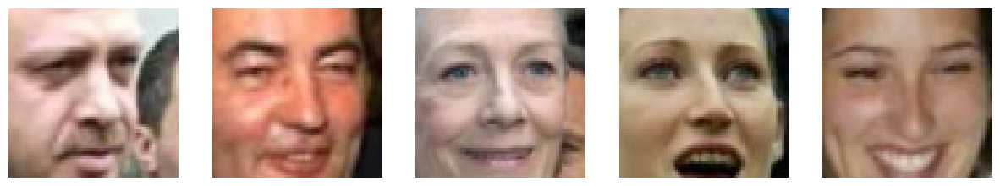

In [ ]:
#Визулизируем несколько изображений
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 5, figsize=(15,5))
for i, ax in enumerate(axes):
  ax.imshow(train_data[i].permute(1, 2, 0).cpu().numpy())
  ax.axis('off')
plt.show()

## 1.2. Архитектура модели (2 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://lilianweng.github.io/posts/2018-08-12-vae/autoencoder-architecture.png" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

In [ ]:
dim_code = 128 # Размерность латентного вектора

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [ ]:
from copy import deepcopy

class Autoencoder(nn.Module):
    def __init__(self):
      super(Autoencoder, self).__init__()

      # Encoder
      self.encoder = nn.Sequential(
          nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
          nn.ReLU(),
          nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
          nn.ReLU(),
          nn.Flatten(),
          nn.Linear(128 * 16 * 16, dim_code)
      )

      # Decoder
      self.decoder = nn.Sequential(
          nn.Linear(dim_code, 128 * 16 * 16),
          nn.ReLU(),
          nn.Unflatten(1, (128, 16, 16)),
          nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
          nn.ReLU(),
          nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
          nn.Sigmoid()
      )


    def forward(self, x):
      latent_code = self.encoder(x)
      reconstruction = self.decoder(latent_code)
      return reconstruction, latent_code

In [ ]:
criterion = nn.MSELoss()

autoencoder = Autoencoder().to(device)

optimizer = optim.Adam(autoencoder.parameters(), lr=1e-3)

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

Epoch 1/20, Train Loss: 0.0175, Val Loss: 0.0088


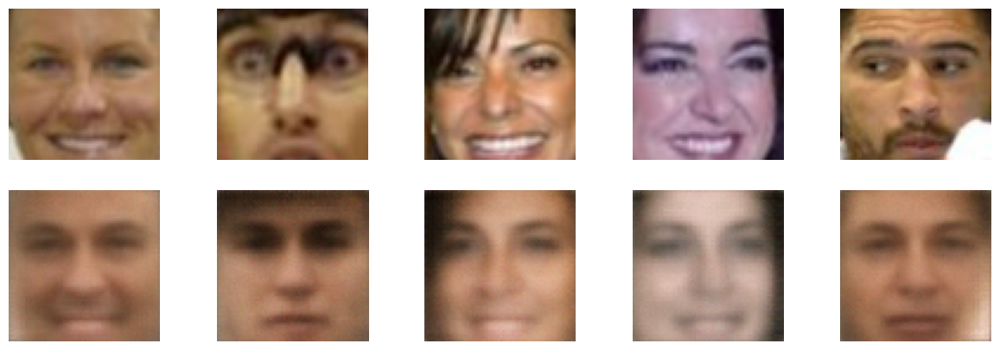

Epoch 2/20, Train Loss: 0.0070, Val Loss: 0.0057


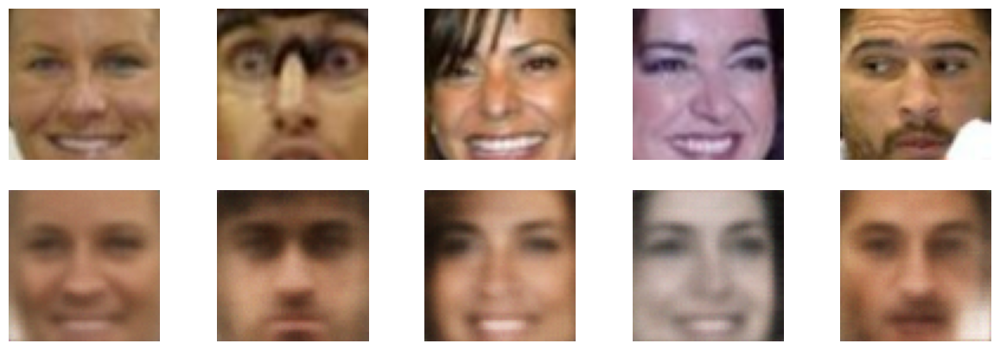

Epoch 3/20, Train Loss: 0.0049, Val Loss: 0.0044


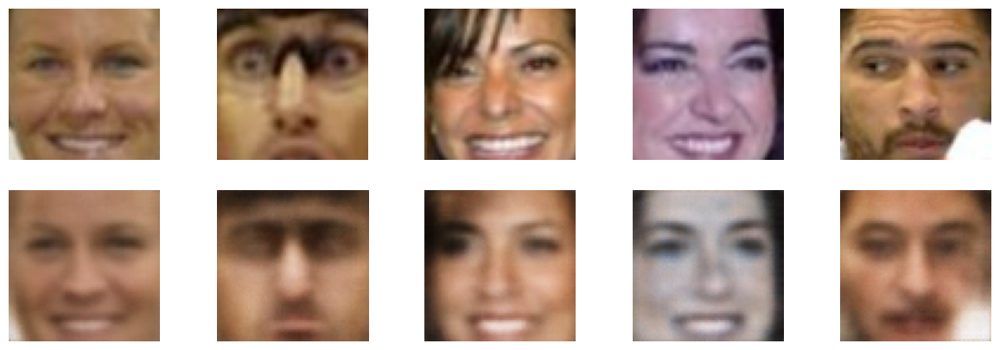

Epoch 4/20, Train Loss: 0.0039, Val Loss: 0.0039


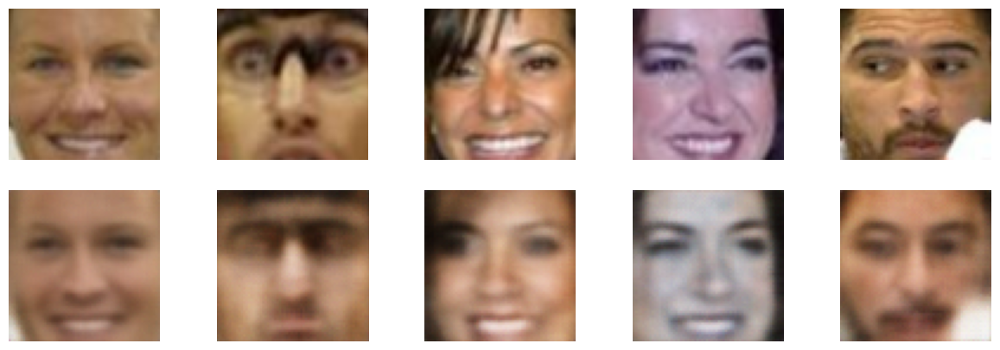

Epoch 5/20, Train Loss: 0.0033, Val Loss: 0.0032


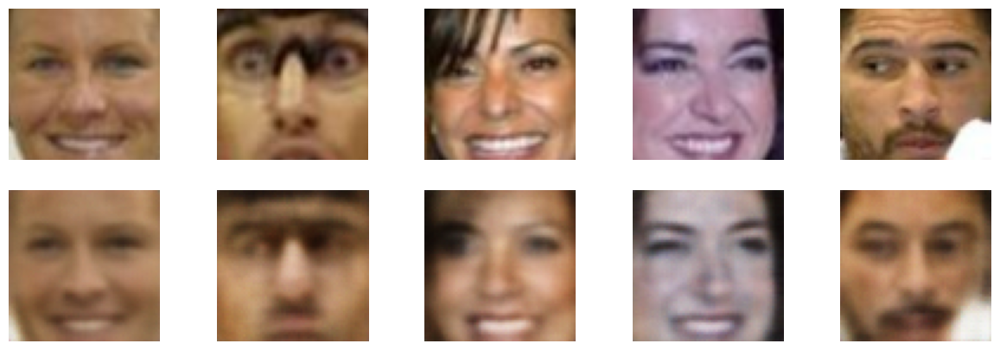

Epoch 6/20, Train Loss: 0.0028, Val Loss: 0.0028


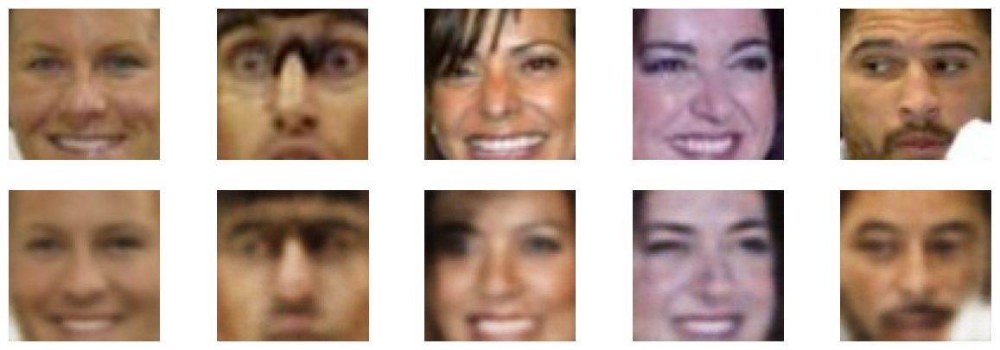

Epoch 7/20, Train Loss: 0.0025, Val Loss: 0.0027


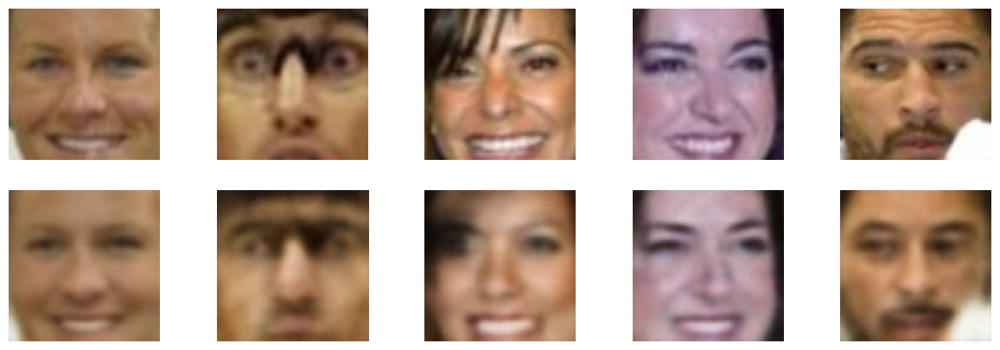

Epoch 8/20, Train Loss: 0.0023, Val Loss: 0.0025


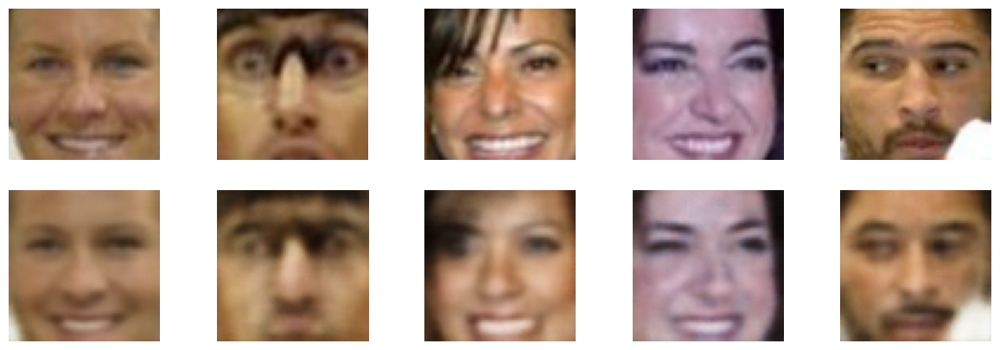

Epoch 9/20, Train Loss: 0.0022, Val Loss: 0.0024


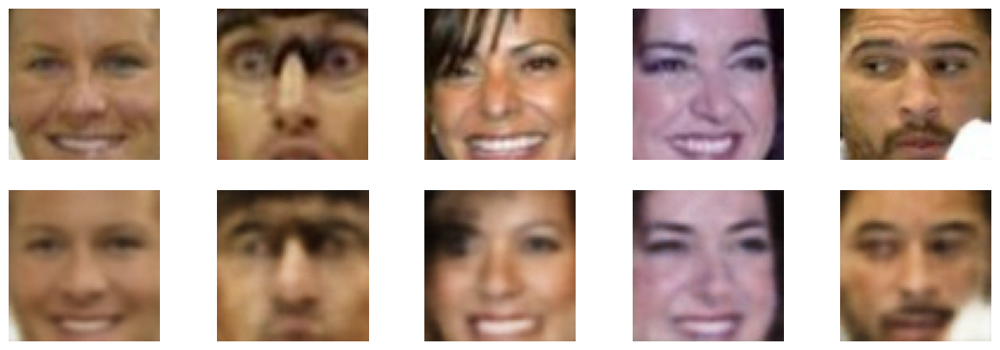

Epoch 10/20, Train Loss: 0.0021, Val Loss: 0.0024


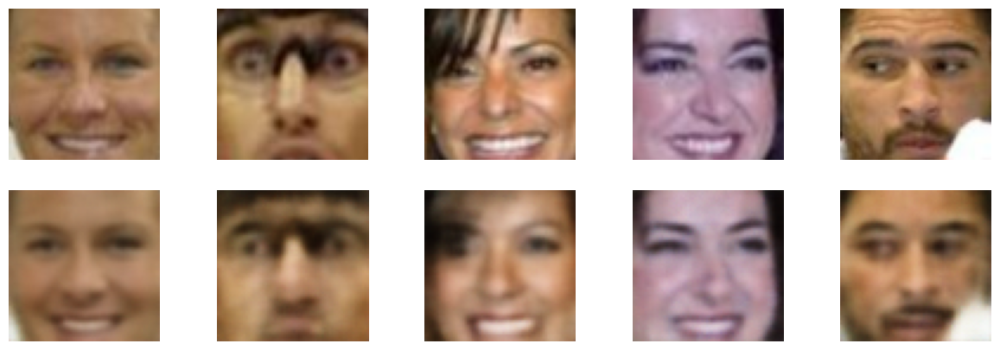

Epoch 11/20, Train Loss: 0.0020, Val Loss: 0.0023


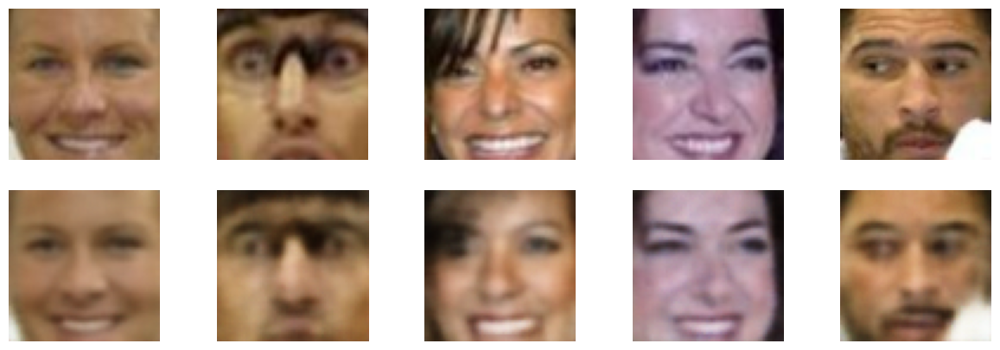

Epoch 12/20, Train Loss: 0.0020, Val Loss: 0.0023


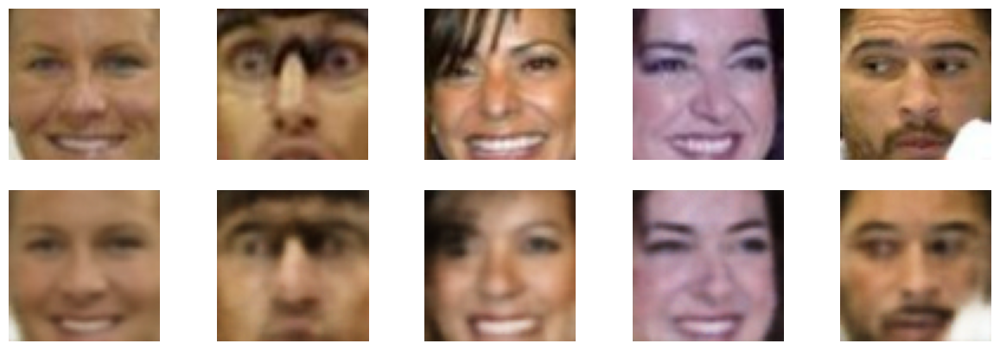

Epoch 13/20, Train Loss: 0.0019, Val Loss: 0.0023


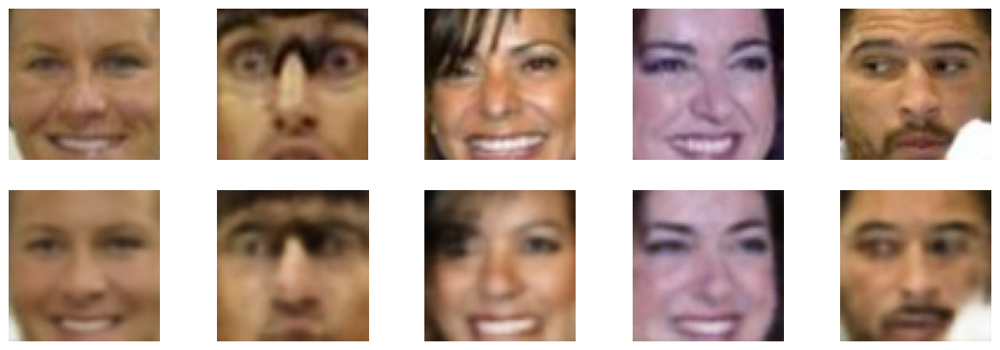

Epoch 14/20, Train Loss: 0.0018, Val Loss: 0.0023


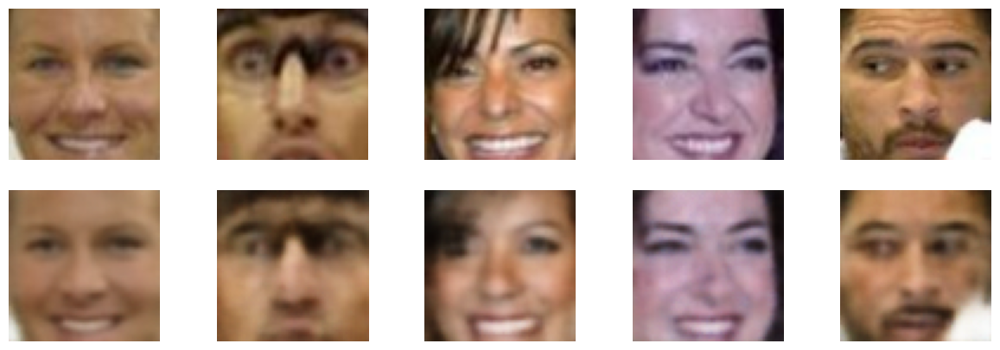

Epoch 15/20, Train Loss: 0.0018, Val Loss: 0.0023


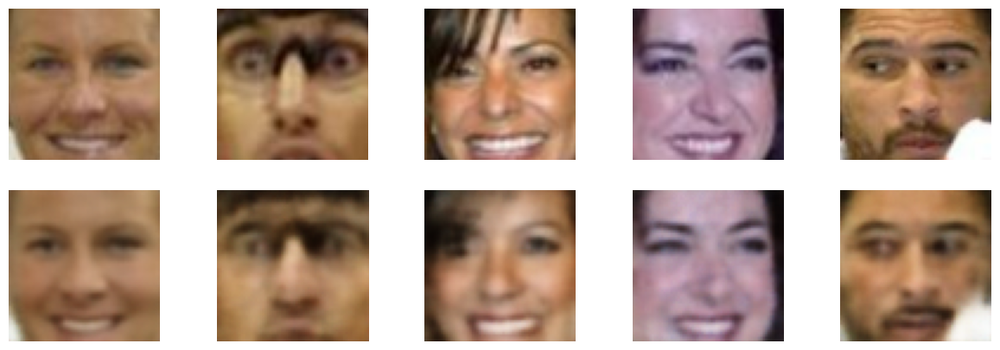

Epoch 16/20, Train Loss: 0.0018, Val Loss: 0.0022


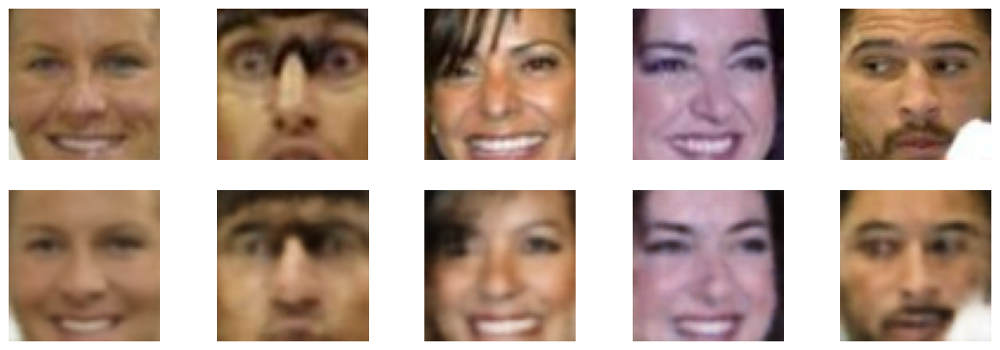

Epoch 17/20, Train Loss: 0.0017, Val Loss: 0.0023


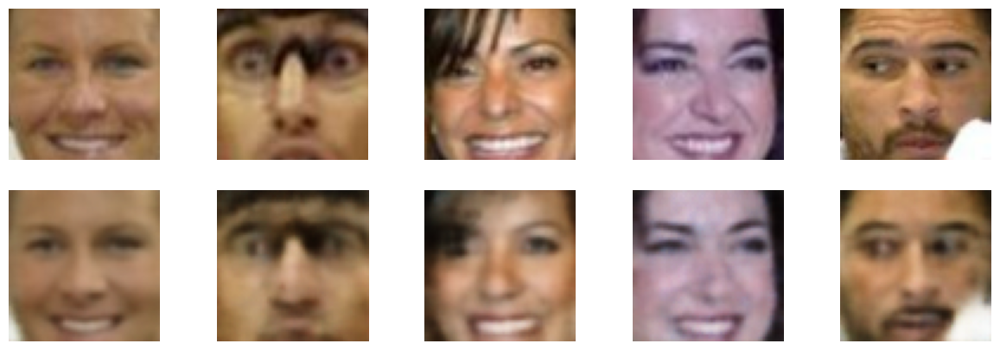

Epoch 18/20, Train Loss: 0.0017, Val Loss: 0.0022


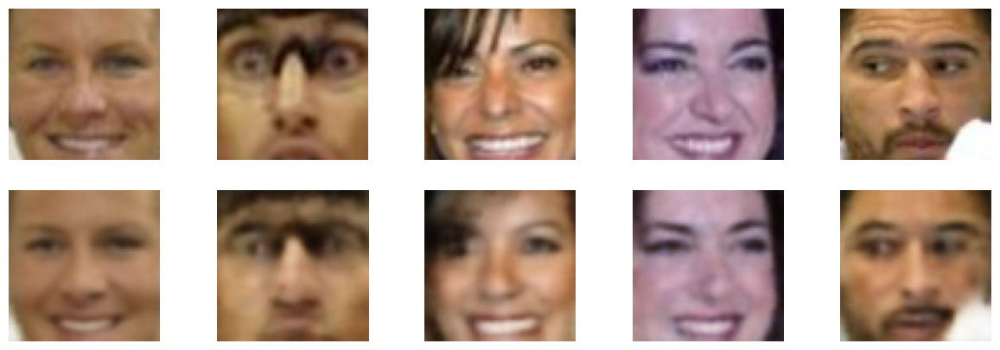

Epoch 19/20, Train Loss: 0.0017, Val Loss: 0.0023


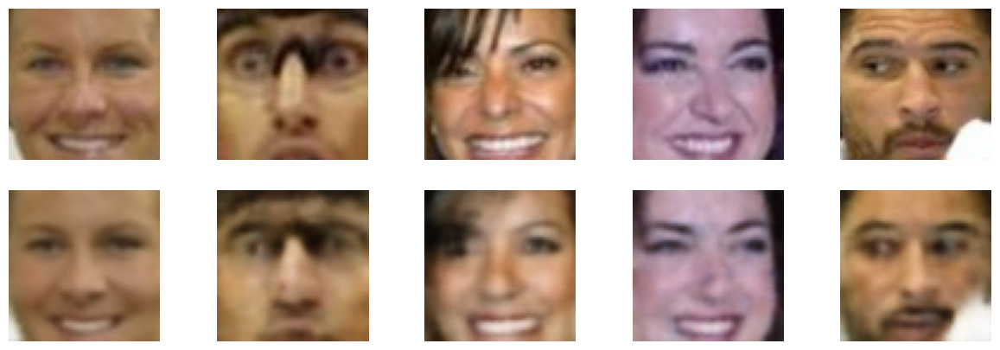

Epoch 20/20, Train Loss: 0.0016, Val Loss: 0.0023


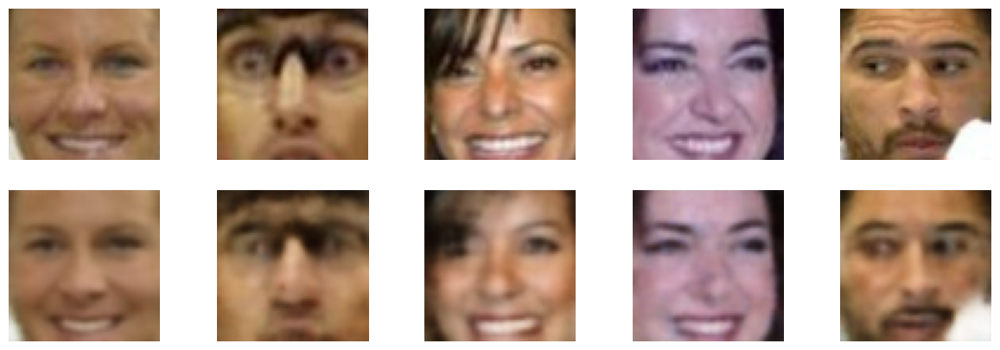

In [ ]:
epochs = 20
train_losses = []
val_losses = []

for epoch in range(epochs):
  # Обучение
  autoencoder.train()
  train_loss = 0.0
  for batch in train_loader:
    images = batch[0].to(device)
    optimizer.zero_grad()
    reconstruction, _ = autoencoder(images)
    loss = criterion(reconstruction, images)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()

  train_loss /= len(train_loader) # Средний по имэджам лосс на эпохе трейна
  train_losses.append(train_loss)

  # Оценка на валидации
  autoencoder.eval()
  val_loss = 0.0
  with torch.no_grad():
    for batch in val_loader:
      images = batch[0].to(device)
      reconstruction, _ = autoencoder(images)
      loss = criterion(reconstruction, images)
      val_loss += loss.item()

  val_loss /= len(val_loader) # Средний по имэджам лосс на эпохе валидации
  val_losses.append(val_loss)

  print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

  # А теперь посмотрим на наших красавцев!!
  sample_images = next(iter(val_loader))[0].to(device)
  reconstructed, _ = autoencoder(sample_images)

  fig, axes = plt.subplots(2, 5, figsize=(15, 5))
  for i in range(5):
      axes[0, i].imshow(sample_images[i].permute(1, 2, 0).cpu().numpy())
      axes[0, i].axis('off')
      axes[1, i].imshow(reconstructed[i].detach().permute(1, 2, 0).cpu().numpy())
      axes[1, i].axis('off')
  plt.show()

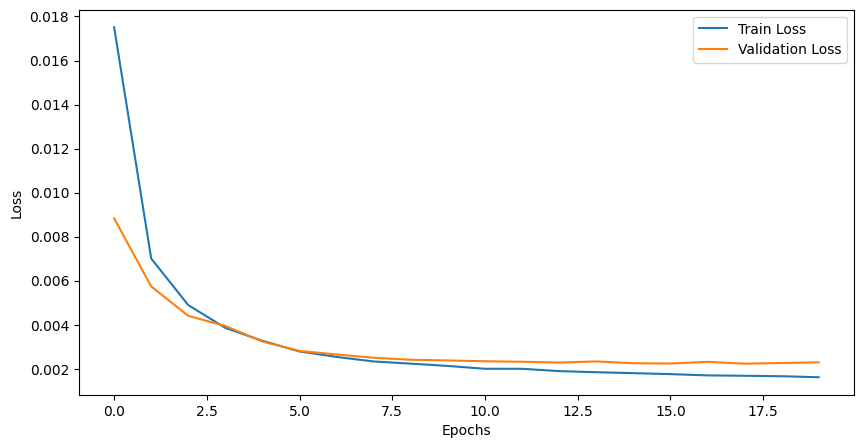

In [ ]:
# Построение графиков лоссов
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Давайте посмотрим, как наш тренированный автоэекодер кодирует и восстанавливает картинки:

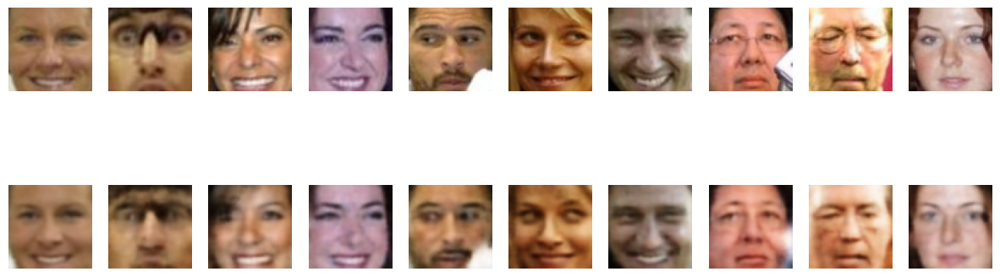

In [ ]:
# Вывод первых X изображений и их реконструкций из val выборки
X = 10
sample_images = next(iter(val_loader))[0][:X]
reconstructed, _ = autoencoder(sample_images)

fig, axes = plt.subplots(2, X, figsize=(15, 5))
for i in range(X):
    axes[0, i].imshow(sample_images[i].permute(1, 2, 0).cpu().numpy())
    axes[0, i].axis('off')
    axes[1, i].imshow(reconstructed[i].detach().permute(1, 2, 0).cpu().numpy())
    axes[1, i].axis('off')
plt.show()

Not bad, right?

*Yeah, so cute*

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__Если вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

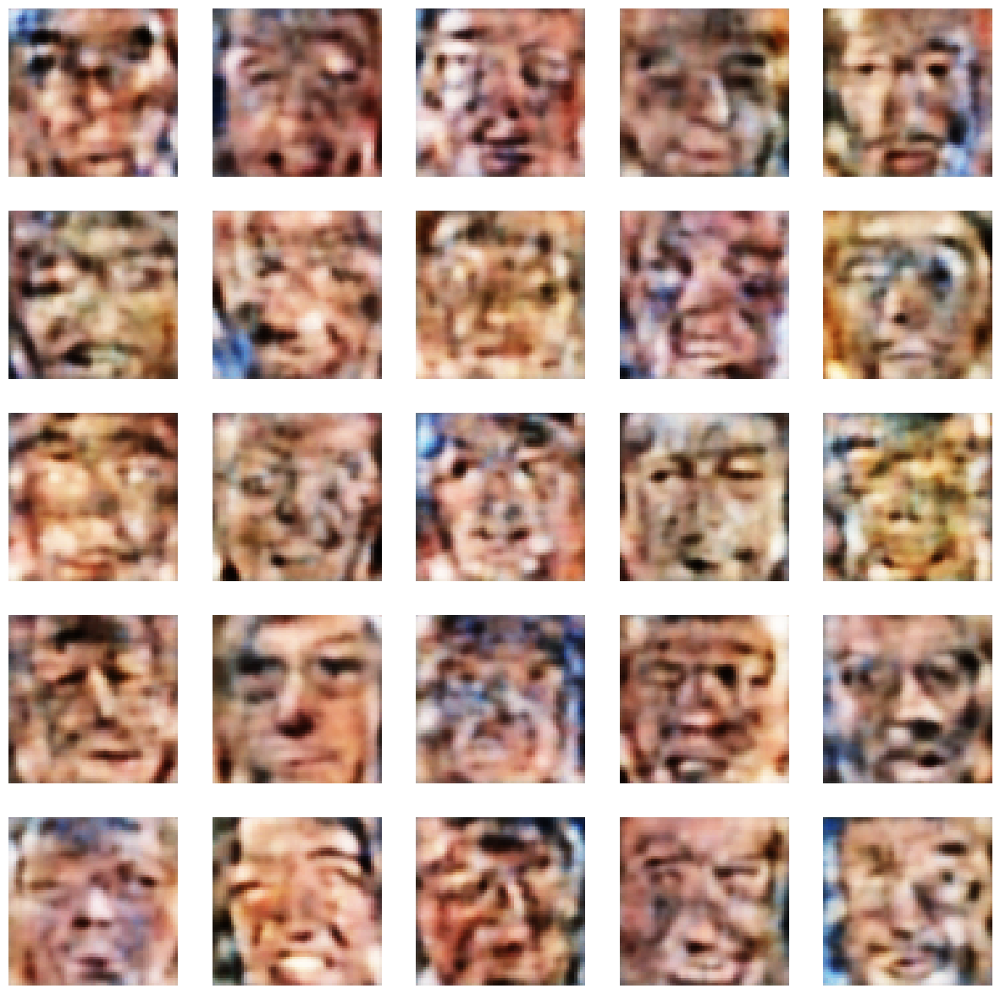

In [ ]:
# сгенерируем 25 рандомных векторов размера latent_space
z = torch.randn(25, dim_code).to(device)
with torch.no_grad():
    generated_images = autoencoder.decoder(z)

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_images[i].detach().cpu().permute(1, 2, 0).numpy())
    ax.axis('off')
plt.show()

*This is my face when I try to do this HW* 🤗

In [ ]:
# Подглянем на наше латентное пространство
real_images = next(iter(val_loader))[0].to(device)

with torch.no_grad():
    _, real_latent_vectors = autoencoder(real_images)

real_latent_vectors = real_latent_vectors.cpu().numpy()

In [ ]:
# узнаем стандартное отклонение и среднее
latent_mean = np.mean(real_latent_vectors, axis=0)
latent_std = np.std(real_latent_vectors, axis=0)

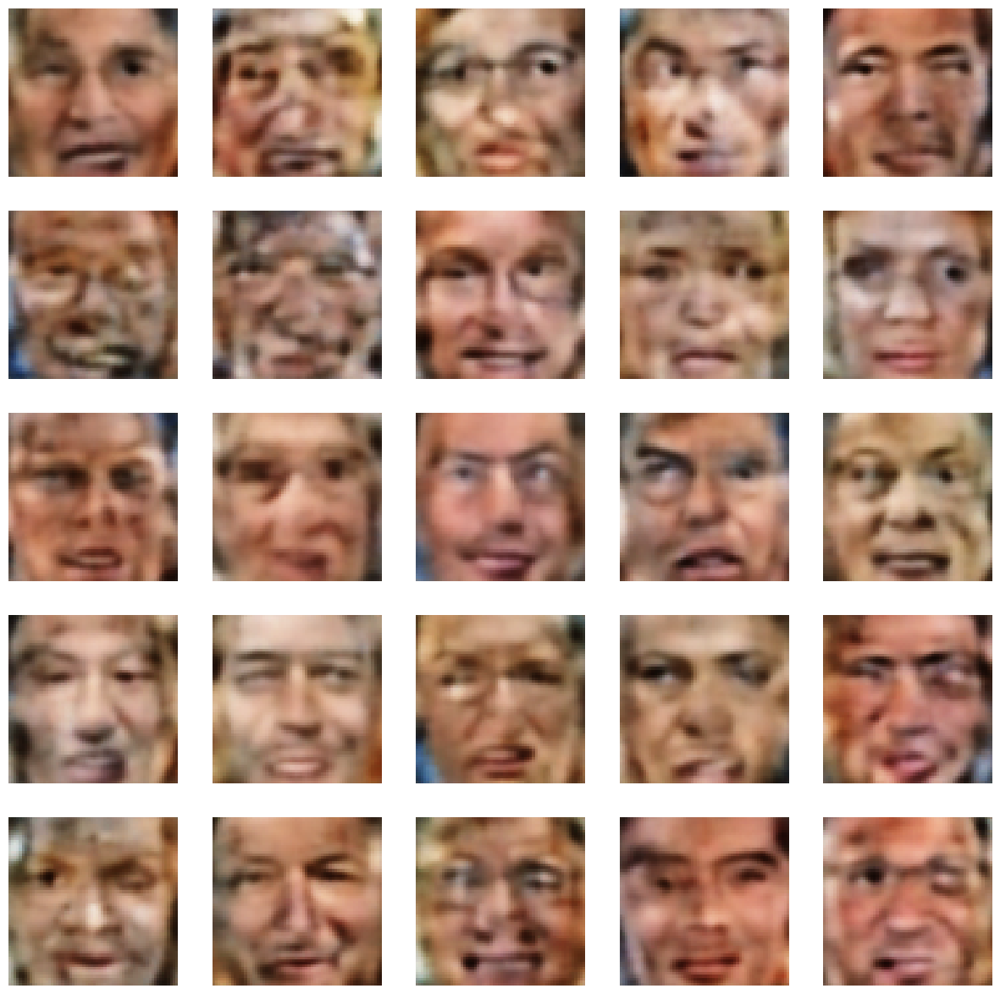

In [ ]:
# а теперь уже на основе этого распределения попытаемся сгенерировать новых красавцев
z = np.random.normal(loc=latent_mean, scale=latent_std, size=(25, dim_code))

# Конвертнем в pytorch тензор
z = torch.tensor(z, dtype=torch.float32).to(device)

with torch.no_grad():
    generated_images = autoencoder.decoder(z)

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_images[i].detach().cpu().permute(1, 2, 0).numpy())
    ax.axis('off')
plt.show()

Beautiful!! 💞

## 1.5 Time to make fun! (3 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

In [ ]:
# Разделим данные на улыбающихся и грустных
smiling_indices = attrs.index[attrs['Smiling'] > 0.75].tolist()
non_smiling_indices = attrs.index[attrs['Smiling'] < -0.75].tolist()

smiling_images = [data[i] for i in smiling_indices]
non_smiling_images = [data[i] for i in non_smiling_indices]

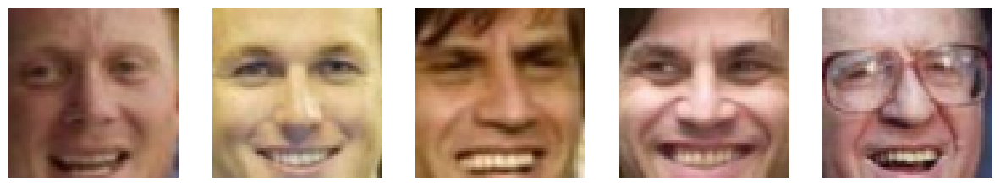

In [ ]:
# Улыбающиеся
fig, axes = plt.subplots(1, 5, figsize=(15,5))
for i, ax in enumerate(axes):
  ax.imshow(smiling_images[i])
  ax.axis('off')

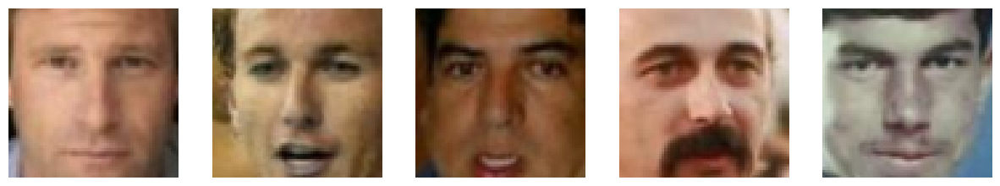

In [ ]:
# Грустные
fig, axes = plt.subplots(1, 5, figsize=(15,5))
for i, ax in enumerate(axes):
  ax.imshow(non_smiling_images[i])
  ax.axis('off')

In [ ]:
# Ограничим выборку 15 изображениями для каждого класса
smiling_images = smiling_images[:15]
non_smiling_images = non_smiling_images[:15]

In [ ]:
# Переведем их в тензоры и отправим на гпу
smiling_images = torch.tensor(smiling_images).permute(0, 3, 1, 2).float().to(device)
non_smiling_images = torch.tensor(non_smiling_images).permute(0, 3, 1, 2).float().to(device)

<ipython-input-24-654acc075a5d>:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  smiling_images = torch.tensor(smiling_images).permute(0, 3, 1, 2).float().to(device)


In [ ]:
# Прогоняем изображения через encoder для получения латентных векторов
smiling_latents = autoencoder.encoder(smiling_images).detach()
non_smiling_latents = autoencoder.encoder(non_smiling_images).detach()

In [ ]:
# Вычисляем средние латентные векторы
mean_smiling = smiling_latents.mean(dim=0)
mean_non_smiling = non_smiling_latents.mean(dim=0)

In [ ]:
# Вычисляем "вектор улыбки"
smile_vector = (mean_smiling - mean_non_smiling) * 1

In [ ]:
# Функция для добавления улыбки
def add_smile(image_tensor):
    latent = autoencoder.encoder(image_tensor.unsqueeze(0)).detach()
    new_latent = latent + smile_vector.unsqueeze(0)
    reconstructed = autoencoder.decoder(new_latent).squeeze(0)
    return reconstructed

In [ ]:
# Выбираем одно грустное изображение для примера
sample_image = non_smiling_images[4]
smiling_version = add_smile(sample_image)

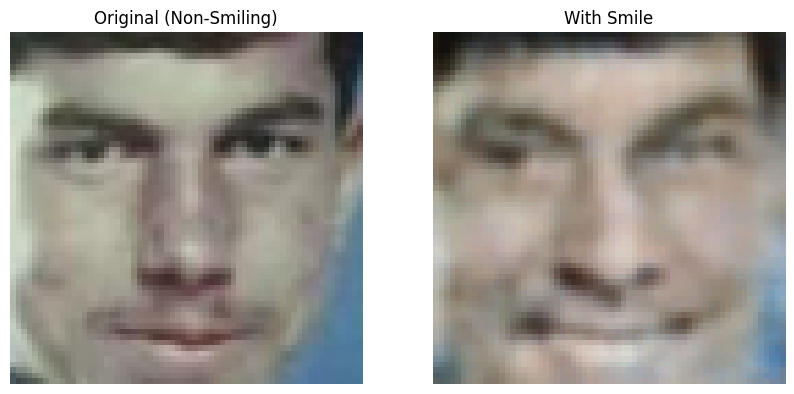

In [ ]:
# Визуализация результата
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(sample_image.permute(1, 2, 0).detach().cpu().numpy())
axes[0].set_title("Original (Non-Smiling)")
axes[0].axis('off')

axes[1].imshow(smiling_version.permute(1, 2, 0).detach().cpu().numpy())
axes[1].set_title("With Smile")
axes[1].axis('off')

plt.show()

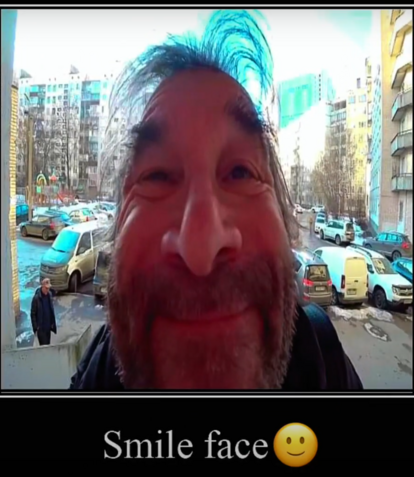

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов)

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [ ]:
from torchvision import datasets, transforms

In [ ]:
batch_size = 32
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 16.4MB/s]


Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 496kB/s]


Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.53MB/s]


Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 4.57MB/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [ ]:
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 128),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(128, 20)  # mu
        self.fc_logsigma = nn.Linear(128, 20)  # logsigma

        # Decoder
        self.decoder_fc = nn.Sequential(
            nn.Linear(20, 128),
            nn.ReLU(),
            nn.Linear(128, 64 * 7 * 7),
            nn.ReLU()
        )
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logsigma = self.fc_logsigma(h)
        return mu, logsigma

    # reparameterization trick
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std) # std в параметрах randn_like это размер
            return mu + eps * std
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z):
        h = self.decoder_fc(z)
        h = h.view(-1, 64, 7, 7)
        reconstruction = self.decoder_conv(h)
        return reconstruction

    def forward(self, x):
        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z)
        return mu, logsigma, reconstruction

Определим лосс и его компоненты для VAE:

*Надеюсь*, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [ ]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    return -0.5 * torch.sum(1 + logsigma - mu.pow(2) - logsigma.exp(), dim=1).mean()

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции (как mse в обычном autoencoder)
    """
    return F.binary_cross_entropy(reconstruction, x, reduction='sum') / x.size(0)

def loss_vae(x, mu, logsigma, reconstruction):
    return KL_divergence(mu, logsigma) + log_likelihood(x, reconstruction)

И обучим модель:

In [ ]:
vae = VAE().to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-3)

In [ ]:
# Обучение модели
epochs = 10
vae.train()
for epoch in range(epochs):
    train_loss = 0
    for x, _ in train_loader:
        x = x.to(device)
        optimizer.zero_grad()
        mu, logsigma, reconstruction = vae(x)
        loss = loss_vae(x, mu, logsigma, reconstruction)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_loss /= len(train_loader.dataset)
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {train_loss:.4f}")

Epoch 1/10, Loss: 4.3316
Epoch 2/10, Loss: 3.4100
Epoch 3/10, Loss: 3.2850
Epoch 4/10, Loss: 3.2310
Epoch 5/10, Loss: 3.1954
Epoch 6/10, Loss: 3.1701
Epoch 7/10, Loss: 3.1510
Epoch 8/10, Loss: 3.1355
Epoch 9/10, Loss: 3.1234
Epoch 10/10, Loss: 3.1121


Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

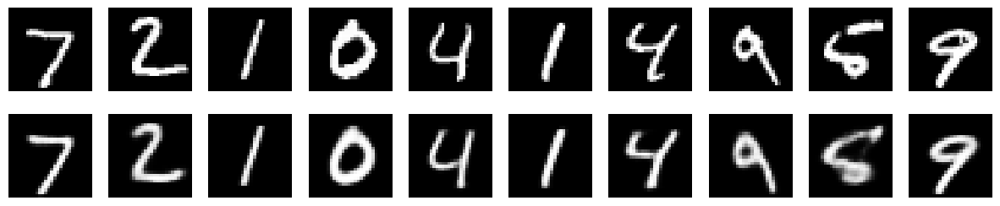

In [ ]:
# Визуализация реконструкций
vae.eval()
data_iter = iter(test_loader)
images, _ = next(data_iter)
images = images.to(device)
mu, logsigma, reconstructions = vae(images)

fig, axes = plt.subplots(2, 10, figsize=(15, 3))
for i in range(10):
    axes[0, i].imshow(images[i].cpu().squeeze(), cmap='gray')
    axes[0, i].axis('off')
    axes[1, i].imshow(reconstructions[i].cpu().detach().squeeze(), cmap='gray')
    axes[1, i].axis('off')
plt.show()

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

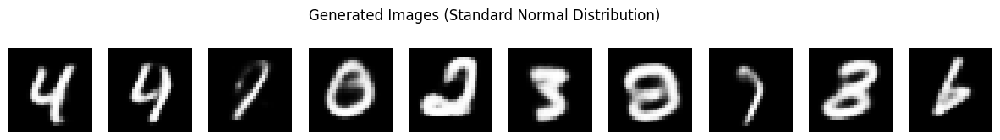

In [ ]:
# Вариант 1: Сэмплирование из стандартного нормального распределения (тыкаем на рандом)
z_std_normal = torch.tensor(np.random.normal(0, 1, (10, 20))).float().to(device)  # 10 латентных векторов размерности 20
output_std = vae.decode(z_std_normal)  # скормим декодеру
output_std = output_std.detach().cpu().numpy()

# Визуализация картинок, полученных в первом варианте
plt.figure(figsize=(15, 2))
for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(output_std[i][0], cmap='gray')
    plt.axis('off')
plt.suptitle("Generated Images (Standard Normal Distribution)")
plt.show()

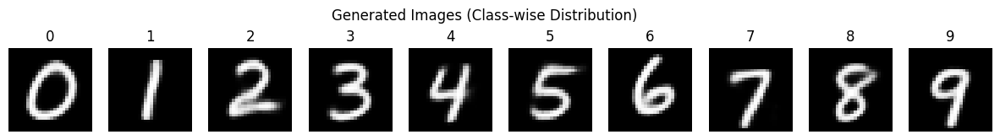

In [ ]:
# Вариант #2: Сэмплирование из подсмотренного распределения

# функция для подсчёта mu и sigma по классам
def compute_class_latent_vectors(vae, loader, num_classes=10):
    class_mu = {i: [] for i in range(num_classes)}
    class_sigma = {i: [] for i in range(num_classes)}

    with torch.no_grad():
        for x, labels in loader:
            x = x.to(device)
            mu, logsigma, _ = vae(x)
            sigma = (0.5 * logsigma).exp()

            for i in range(num_classes):
                mask = (labels == i)
                class_mu[i].append(mu[mask].cpu().numpy())
                class_sigma[i].append(sigma[mask].cpu().numpy())

    for i in range(num_classes):
        class_mu[i] = np.mean(np.vstack(class_mu[i]), axis=0)
        class_sigma[i] = np.mean(np.vstack(class_sigma[i]), axis=0)

    return class_mu, class_sigma

# Вычисляем mu и sigma для каждой цифры
class_mu, class_sigma = compute_class_latent_vectors(vae, test_loader)

# Сэмплирование для визуализации
def visualize_class_generation(class_mu, class_sigma, vae, num_samples=10):
    plt.figure(figsize=(15, 2))
    for i in range(num_samples):
        class_id = i % 10  # Выбираем класс (цифру)
        z = torch.tensor(np.random.normal(class_mu[class_id], class_sigma[class_id])).float().to(device)
        output = vae.decode(z.unsqueeze(0))  # Добавляем размер батча
        output = output.detach().cpu().numpy()

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(output[0][0], cmap='gray')  # Отображаем изображение
        plt.axis('off')
        plt.title(str(class_id))
    plt.suptitle("Generated Images (Class-wise Distribution)")
    plt.show()

# Визуализация сэмплирования
visualize_class_generation(class_mu, class_sigma, vae)

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве.

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве.

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

In [ ]:
from sklearn.manifold import TSNE

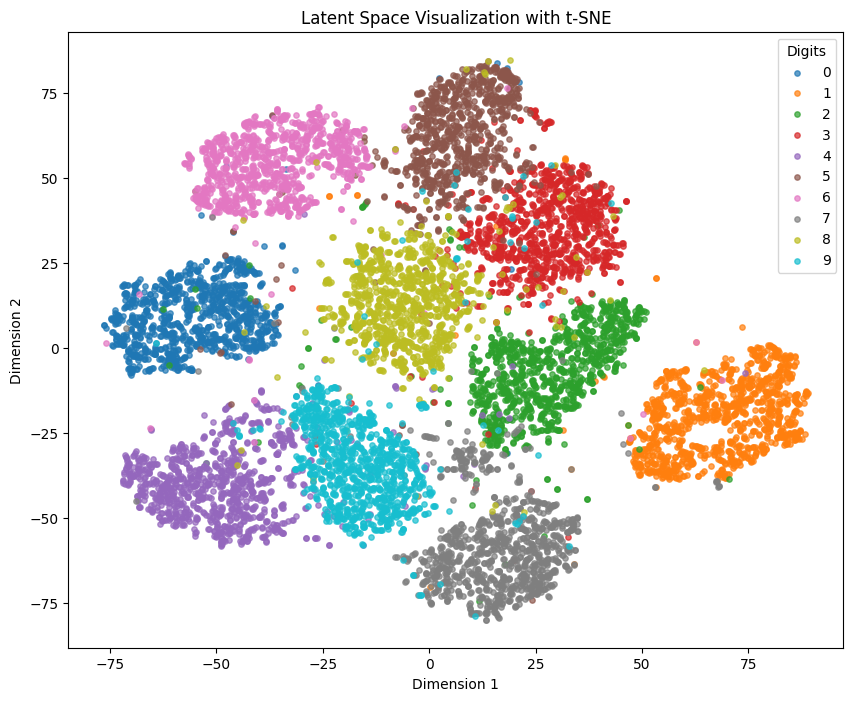

In [ ]:
# Получение латентных представлений для тестового датасета
def get_latent_vectors(vae, loader):
    latent_vectors = []
    labels = []
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            mu, _, _ = vae(x)  # Получаем только mu
            latent_vectors.append(mu.cpu().numpy())
            labels.append(y.numpy())
    return np.vstack(latent_vectors), np.hstack(labels)

# Получаем латентные векторы и соответствующие метки
latent_vectors, labels = get_latent_vectors(vae, test_loader)

# Применяем t-SNE для уменьшения размерности до 2
tsne = TSNE(n_components=2, random_state=42)
latent_2d = tsne.fit_transform(latent_vectors)

# Визуализация с использованием scatter
plt.figure(figsize=(10, 8))
colors = plt.cm.tab10  # Набор из 10 цветов для цифр 0-9
for digit in range(10):
    mask = labels == digit
    plt.scatter(latent_2d[mask, 0], latent_2d[mask, 1], c=[colors(digit)], label=str(digit), s=15, alpha=0.7)

plt.title("Latent Space Visualization with t-SNE")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend(title="Digits", loc="best")
plt.show()

Что вы думаете о виде латентного представления?

*Да, это конечно не Самара, и не Урюпинск, но красиво*

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер.
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица).
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки.

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [ ]:
class CVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, class_dim, hidden_dim):
        super(CVAE, self).__init__()

        # Encoder
        self.encoder_fc = nn.Linear(input_dim + class_dim, hidden_dim)
        self.mu_fc = nn.Linear(hidden_dim, latent_dim)
        self.logsigma_fc = nn.Linear(hidden_dim, latent_dim)

        # Decoder
        self.decoder_fc1 = nn.Linear(latent_dim + class_dim, hidden_dim)
        self.decoder_fc2 = nn.Linear(hidden_dim, input_dim)

    def encode(self, x, class_num):
        x = torch.cat([x, class_num], dim=1)
        hidden = F.relu(self.encoder_fc(x))
        mu = self.mu_fc(hidden)
        logsigma = self.logsigma_fc(hidden)
        return mu, logsigma

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std
        else:
            return mu

    def decode(self, z, class_num):
        z = torch.cat([z, class_num], dim=1)
        hidden = F.relu(self.decoder_fc1(z))
        reconstruction = torch.sigmoid(self.decoder_fc2(hidden))
        return reconstruction

    def forward(self, x, class_num):
        mu, logsigma = self.encode(x, class_num)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z, class_num)
        return mu, logsigma, reconstruction

In [ ]:
# Тренируем
input_dim = 28 * 28
latent_dim = 20
class_dim = 10
hidden_dim = 400

cvae = CVAE(input_dim, latent_dim, class_dim, hidden_dim).to(device)
optimizer = torch.optim.Adam(cvae.parameters(), lr=1e-3)

for epoch in range(10):
    for batch in train_loader:
        images, labels = batch
        images = images.view(-1, input_dim).to(device)
        labels_onehot = F.one_hot(labels, num_classes=class_dim).float().to(device)

        optimizer.zero_grad()
        mu, logsigma, recon_images = cvae(images, labels_onehot)
        loss = loss_vae(images, mu, logsigma, recon_images)
        loss.backward()
        optimizer.step()

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

In [ ]:
sample_class = torch.tensor([4]).to(device)  # Generate digit '4'
sample_class_onehot = F.one_hot(sample_class, num_classes=class_dim).float()
sample_z = torch.randn(1, latent_dim).to(device)  # Random latent vector
sample_image = cvae.decode(sample_z, sample_class_onehot)

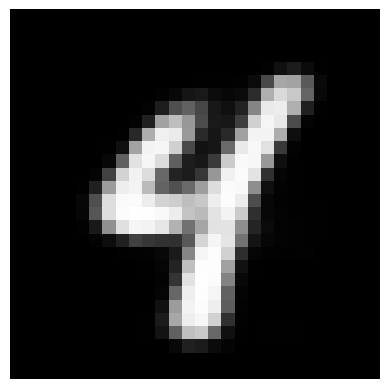

In [ ]:
plt.imshow(sample_image.view(28, 28).detach().cpu().numpy(), cmap='gray')
plt.axis('off')
plt.show()

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

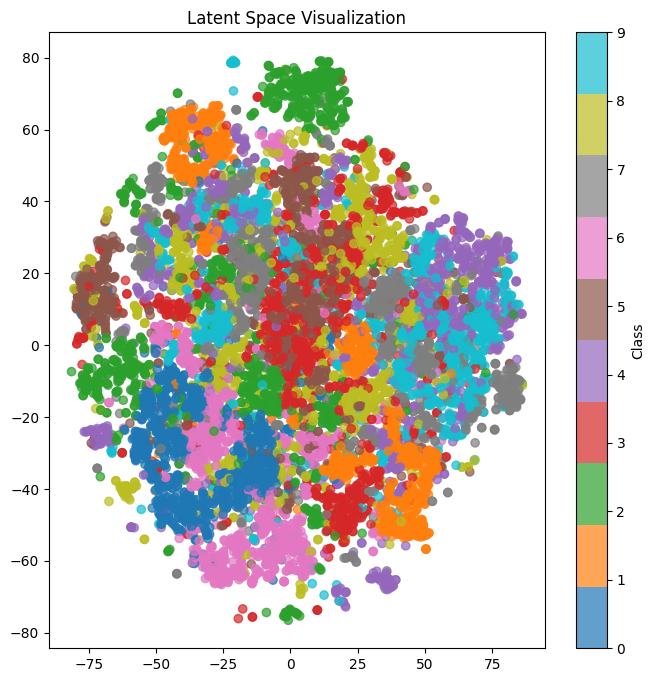

In [ ]:
def visualize_latent_space(model, dataloader):
    latents, labels = [], []
    for batch in dataloader:
        images, batch_labels = batch
        images = images.view(-1, input_dim).to(device)
        labels_onehot = F.one_hot(batch_labels, num_classes=class_dim).float().to(device)

        mu, _ = model.encode(images, labels_onehot)
        latents.append(mu.detach().cpu().numpy())
        labels.append(batch_labels.cpu().numpy())

    latents = np.concatenate(latents, axis=0)
    labels = np.concatenate(labels, axis=0)

    tsne = TSNE(n_components=2)
    latents_2d = tsne.fit_transform(latents)

    plt.figure(figsize=(8, 8))
    scatter = plt.scatter(latents_2d[:, 0], latents_2d[:, 1], c=labels, cmap="tab10", alpha=0.7)
    plt.colorbar(scatter, label="Class")
    plt.title("Latent Space Visualization")
    plt.show()

visualize_latent_space(cvae, test_loader)

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

**Да**, отличается. VAE сам старается выучивать как-то информацию о различии классов, поэтому в его латентном представлении данная информация присутствует. А вот в CVAE получает знания о классах извне, поэтому наш латентный вектор это какая-то каша из вектора изображения + one hot лейбла

**A bonus will be made, sometime...**

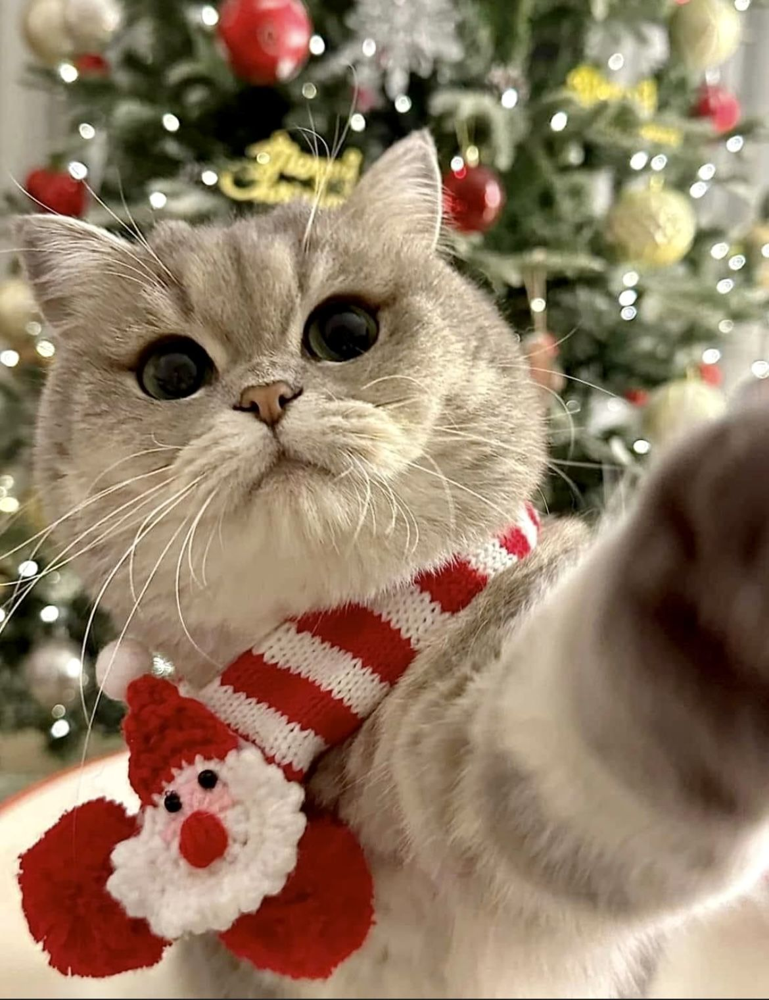

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума.
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом.

В питоне шум можно добавить так:

In [ ]:
noise_factor = 0.5
X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)

In [ ]:
<тут ваш код обучения автоэнкодера на зашумленных картинках. Не забудтье разбить на train/test!>

In [ ]:
<тут проверка, как AE убирает щум с тестовых картинок. Надеюсь, все получилось =)>

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [ ]:
codes = <поучите латентные представления картинок из трейна>

In [ ]:
# обучаем LSHForest
from sklearn.neighbors import LSHForest
lshf = LSHForest(n_estimators=50).fit(codes)

In [ ]:
def get_similar(image, n_neighbors=5):
  # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
  # прогоняет векторы через декодер и получает картинки ближайших людей

  code = <получение латентного представления image>

  (distances,),(idx,) = lshf.kneighbors(code, n_neighbors=n_neighbors)

  return distances, X_train[idx]

In [ ]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат

    distances,neighbors = get_similar(image,n_neighbors=11)

    plt.figure(figsize=[8,6])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy().transpose([1,2,0]))
    plt.title("Original image")

    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy().transpose([1,2,0]))
        plt.title("Dist=%.3f"%distances[i])
    plt.show()

In [ ]:
<тут выведите самые похожие лица к какому-нибудь лицу из тестовой части датасета>